# San Francisco Crime Classification
- Predict the category of crimes that occurred in the city by the bay

$$ logloss={-\frac{1}{N}}\sum_{i=1}^N\sum_{j=1}^My_{ij}log(p_{ij})$$

## 1. Overview

### 1) Data Shape

In [2]:
df_train = pd.read_csv("./data/train.csv", parse_dates=['Dates'])
df_test = pd.read_csv("test.csv", parse_dates=['Dates'])

In [3]:
df_train.tail()

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y
878044,2003-01-06 00:15:00,ROBBERY,ROBBERY ON THE STREET WITH A GUN,Monday,TARAVAL,NONE,FARALLONES ST / CAPITOL AV,-122.459033,37.714056
878045,2003-01-06 00:01:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Monday,INGLESIDE,NONE,600 Block of EDNA ST,-122.447364,37.731948
878046,2003-01-06 00:01:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Monday,SOUTHERN,NONE,5TH ST / FOLSOM ST,-122.403390,37.780266
878047,2003-01-06 00:01:00,VANDALISM,"MALICIOUS MISCHIEF, VANDALISM OF VEHICLES",Monday,SOUTHERN,NONE,TOWNSEND ST / 2ND ST,-122.390531,37.780607
878048,2003-01-06 00:01:00,FORGERY/COUNTERFEITING,"CHECKS, FORGERY (FELONY)",Monday,BAYVIEW,NONE,1800 Block of NEWCOMB AV,-122.394926,37.738212


In [4]:
df_test.tail()

,Id,Dates,DayOfWeek,PdDistrict,Address,X,Y
884257,884257,2003-01-01 00:01:00,Wednesday,MISSION,2600 Block of BRYANT ST,-122.408983,37.751987
884258,884258,2003-01-01 00:01:00,Wednesday,NORTHERN,1900 Block of WASHINGTON ST,-122.425342,37.792681
884259,884259,2003-01-01 00:01:00,Wednesday,INGLESIDE,5500 Block of MISSION ST,-122.445418,37.712075
884260,884260,2003-01-01 00:01:00,Wednesday,BAYVIEW,1500 Block of HUDSON AV,-122.387394,37.739479
884261,884261,2003-01-01 00:01:00,Wednesday,TARAVAL,1500 Block of SLOAT BL,-122.489714,37.733950


### 2) column 설명

##### 1. Dates (사건일자)
: timestamp of the crime incident
##### 2. Category (범죄유형 - 종속변수)
: category of the crime incident (only in train.csv). This is the target variable you are going to predict.
##### 3. Descript (범죄 세부정보)
: detailed description of the crime incident (only in train.csv)
##### 4. DayOfWeek (요일)
: the day of the week
##### 5. PdDistrict (관할서)
: name of the Police Department District
##### 6. Resolution (처벌결과)
: how the crime incident was resolved (only in train.csv)
##### 7. Address (사건현장 대략적 주소)
: the approximate street address of the crime incident 
##### 8. X (경도)
:Longitude
##### 9. Y (위도)
: Latitude

In [6]:
for i in df_train.columns:
    print(i, "\n", df_train[i].unique(), len(df_train[i].unique()))

Dates 
 ['2015-05-13T23:53:00.000000000' '2015-05-13T23:33:00.000000000'
 '2015-05-13T23:30:00.000000000' ... '2003-01-06T00:20:00.000000000'
 '2003-01-06T00:15:00.000000000' '2003-01-06T00:01:00.000000000'] 389257
Category 
 ['WARRANTS' 'OTHER OFFENSES' 'LARCENY/THEFT' 'VEHICLE THEFT' 'VANDALISM'
 'NON-CRIMINAL' 'ROBBERY' 'ASSAULT' 'WEAPON LAWS' 'BURGLARY'
 'SUSPICIOUS OCC' 'DRUNKENNESS' 'FORGERY/COUNTERFEITING' 'DRUG/NARCOTIC'
 'STOLEN PROPERTY' 'SECONDARY CODES' 'TRESPASS' 'MISSING PERSON' 'FRAUD'
 'KIDNAPPING' 'RUNAWAY' 'DRIVING UNDER THE INFLUENCE'
 'SEX OFFENSES FORCIBLE' 'PROSTITUTION' 'DISORDERLY CONDUCT' 'ARSON'
 'FAMILY OFFENSES' 'LIQUOR LAWS' 'BRIBERY' 'EMBEZZLEMENT' 'SUICIDE'
 'LOITERING' 'SEX OFFENSES NON FORCIBLE' 'EXTORTION' 'GAMBLING'
 'BAD CHECKS' 'TREA' 'RECOVERED VEHICLE' 'PORNOGRAPHY/OBSCENE MAT'] 39
Descript 
 ['WARRANT ARREST' 'TRAFFIC VIOLATION ARREST'
 'GRAND THEFT FROM LOCKED AUTO' 'GRAND THEFT FROM UNLOCKED AUTO'
 'STOLEN AUTOMOBILE' 'PETTY THEFT FROM LOCKED A

DayOfWeek 
 ['Wednesday' 'Tuesday' 'Monday' 'Sunday' 'Saturday' 'Friday' 'Thursday'] 7
PdDistrict 
 ['NORTHERN' 'PARK' 'INGLESIDE' 'BAYVIEW' 'RICHMOND' 'CENTRAL' 'TARAVAL'
 'TENDERLOIN' 'MISSION' 'SOUTHERN'] 10
Resolution 
 ['ARREST, BOOKED' 'NONE' 'ARREST, CITED' 'PSYCHOPATHIC CASE'
 'JUVENILE BOOKED' 'UNFOUNDED' 'EXCEPTIONAL CLEARANCE' 'LOCATED'
 'CLEARED-CONTACT JUVENILE FOR MORE INFO' 'NOT PROSECUTED'
 'JUVENILE DIVERTED' 'COMPLAINANT REFUSES TO PROSECUTE'
 'JUVENILE ADMONISHED' 'JUVENILE CITED'
 'DISTRICT ATTORNEY REFUSES TO PROSECUTE' 'PROSECUTED BY OUTSIDE AGENCY'
 'PROSECUTED FOR LESSER OFFENSE'] 17
Address 
 ['OAK ST / LAGUNA ST' 'VANNESS AV / GREENWICH ST'
 '1500 Block of LOMBARD ST' ... '300 Block of JOHN F KENNEDY DR'
 'FOLSOM ST / ZENO PL' '1000 Block of 22ND AV'] 23228
X 
 [-122.42589168 -122.42436302 -122.42699533 ... -122.48124622 -122.41850208
 -122.39492572] 34243
Y 
 [37.7745986  37.80041432 37.80087263 ... 37.77644744 37.73394539
 37.73821154] 34243


test데이터에 Descript, Resolution column이 없으므로 train에서 Descript, Resolution column 제거 

##### Drop Descript, Resolution in train

In [3]:
df_train.drop(columns=['Descript','Resolution'],inplace=True)

## 2. EDA & Feature Extraction
- 시간 : year, month, hour column 추출 + DayOfWeek
- 공간 : isIntersection, isStreet 추출 + PdDistrict, X, Y

In [4]:
df_train['year'] = df_train['Dates'].map(lambda x: x.year)
df_train['month'] = df_train['Dates'].map(lambda x: x.month)
df_train['hour'] = df_train['Dates'].map(lambda x: x.hour)

In [5]:
df_train.drop(columns='Dates', inplace=True)
df_train.tail()

,Category,DayOfWeek,PdDistrict,Address,X,Y,year,month,hour
878044,ROBBERY,Monday,TARAVAL,FARALLONES ST / CAPITOL AV,-122.459033,37.714056,2003,1,0
878045,LARCENY/THEFT,Monday,INGLESIDE,600 Block of EDNA ST,-122.447364,37.731948,2003,1,0
878046,LARCENY/THEFT,Monday,SOUTHERN,5TH ST / FOLSOM ST,-122.403390,37.780266,2003,1,0
878047,VANDALISM,Monday,SOUTHERN,TOWNSEND ST / 2ND ST,-122.390531,37.780607,2003,1,0
878048,FORGERY/COUNTERFEITING,Monday,BAYVIEW,1800 Block of NEWCOMB AV,-122.394926,37.738212,2003,1,0


In [6]:
df = df_train.copy()

In [5]:
df_train['event'] = 1
df_test['event'] = 1

##### 1) 요일별 범죄발생수

In [13]:
crime_by_dayofweek = df_train[['Category','DayOfWeek','event']].groupby(['Category','DayOfWeek']).count().reset_index()
crime_by_dayofweek_pivot1 = crime_by_dayofweek.pivot(index='Category',columns='DayOfWeek',values='event')
crime_by_dayofweek_pivot1

DayOfWeek,Friday,Monday,Saturday,Sunday,Thursday,Tuesday,Wednesday
Category,,,,,,,
ARSON,220.0,228.0,220.0,211.0,199.0,235.0,200.0
ASSAULT,11160.0,10560.0,11995.0,12082.0,10246.0,10280.0,10553.0
BAD CHECKS,62.0,66.0,45.0,20.0,66.0,76.0,71.0
BRIBERY,49.0,41.0,42.0,41.0,39.0,37.0,40.0
BURGLARY,6327.0,5262.0,4754.0,4231.0,5350.0,5374.0,5457.0
DISORDERLY CONDUCT,541.0,608.0,624.0,586.0,644.0,657.0,660.0
DRIVING UNDER THE INFLUENCE,352.0,263.0,457.0,442.0,282.0,251.0,221.0
DRUG/NARCOTIC,7420.0,7823.0,6390.0,6143.0,8454.0,8474.0,9267.0
DRUNKENNESS,622.0,513.0,833.0,813.0,496.0,461.0,542.0


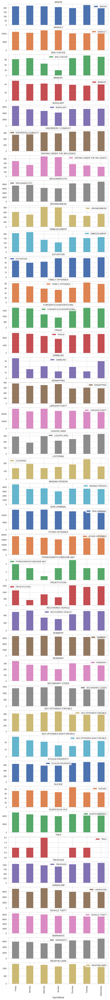

In [16]:
crime_by_dayofweek_pivot = crime_by_dayofweek.pivot(index='DayOfWeek',columns='Category',values='event')
crime_by_dayofweek_pivot.plot(kind='bar', subplots=True, figsize=(10,100),sharex=True)
plt.show()

모든 범죄에서 요일별로 범죄발생수에 차이를 보인다. 

##### 2) 연도별 범죄발생수

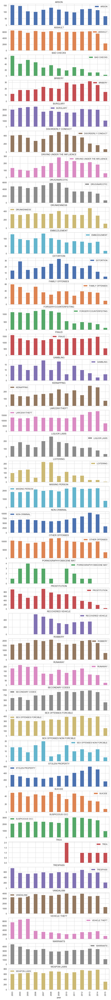

In [18]:
crime_by_year = df_train[['Category','year','event']].groupby(['Category','year']).count().reset_index()
crime_by_year_pivot = crime_by_year.pivot(index='year',columns='Category',values='event')
crime_by_year_pivot.plot(kind='bar', subplots=True, figsize=(10,100))
plt.show()

범죄별로 연도별 범죄발생수에 차이를 보인다.

##### 3) 시간대별 범죄발생수

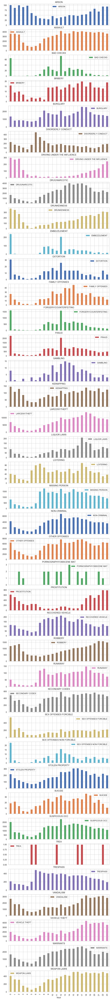

In [19]:
crime_by_hour = df_train[['Category','hour','event']].groupby(['Category','hour']).count().reset_index()
crime_by_hour_pivot = crime_by_hour.pivot(index='hour',columns='Category',values='event')
crime_by_hour_pivot.plot(kind='bar', subplots=True, figsize=(10,100))
plt.show()

범죄별로 시간대별 범죄발생수에 차이를 보인다.

##### 4) 월별 범죄발생수

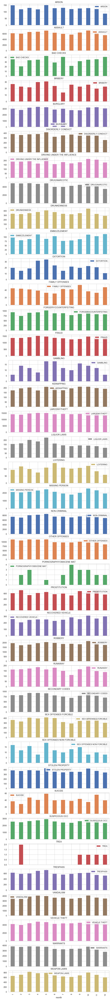

In [21]:
crime_by_month = df_train[['Category','month','event']].groupby(['Category','month']).count().reset_index()
crime_by_month_pivot = crime_by_month.pivot(index='month',columns='Category',values='event')
crime_by_month_pivot.plot(kind='bar', subplots=True, figsize=(10,100))
plt.show()

##### Year, Month, DayOfWeek, Hour별로 target이 상이하므로, classification에서 유의한 결과를 가져올 것이라 가정한다.

In [7]:
# 앞뒤가 뒤바뀐 주소가 존재한다.
print(df[df.Address == "OAK ST / LAGUNA ST"].size)
print(df[df.Address == "LAGUNA ST / OAK ST"].size)

405
243


In [8]:
# 중복된 주소 제거해보자
# 1. Address에서 '/'를 포함한 index추출(교차로) 
idx = df[df.Address.str.contains('/')].index

In [9]:
len(set(df.loc[idx,"Address"]))

12278

In [15]:
a1 = "OAK ST / LAGUNA ST"
a2 = "LAGUNA ST / OAK ST"
result1 = sorted(a1.split(" / "))
result2 = sorted(a2.split(" / "))
print(result1, result2)

['LAGUNA ST', 'OAK ST'] ['LAGUNA ST', 'OAK ST']


In [10]:
renewals = [sorted(address.split(" / ")) for address in df.loc[idx,"Address"]]
renewal_address = np.array([" / ".join(renewal).strip() for renewal in renewals])
renewal_address

array(['LAGUNA ST / OAK ST', 'LAGUNA ST / OAK ST',
       'GREENWICH ST / VANNESS AV', ..., 'CAPITOL AV / FARALLONES ST',
       '5TH ST / FOLSOM ST', '2ND ST / TOWNSEND ST'], dtype='<U44')

In [17]:
# 12278개 교차로 --> 6862개 교차로 : 5416개 중복 제거
len(set(renewal_address))

6862

In [11]:
df.Address.nunique()

23228

In [12]:
df.loc[idx, "Address"] = renewal_address
df.Address.nunique()

17812

In [13]:
# 완료
23228 - 17812

5416

In [14]:
len(df)

878049

In [15]:
idx = df[df.Y == 90.0].index
df.drop(index=idx, inplace=True)
len(df)

877982

In [16]:
def street_addr(x):
    street=x.split(' ')
    return (' '.join(street[-1:]))

In [17]:
df['addr']=df['Address'].apply(lambda x:street_addr(x))
df['addr'].tail()

878044    ST
878045    ST
878046    ST
878047    ST
878048    AV
Name: addr, dtype: object

In [18]:
df['addr'].nunique()

29

In [19]:
df['addr'].unique(),len(df['addr'].unique()) 

(array(['ST', 'AV', 'WY', 'BL', 'DR', 'CT', 'TR', 'HY', 'RD', 'PZ', 'PL',
        'LN', 'WAY', 'CR', 'AL', 'PALMS', 'TER', 'STWY', 'HWY',
        'FERLINGHETTI', 'WK', 'EX', 'RW', 'BUFANO', 'MAR', 'I-80', 'I-280',
        'PARK', '/'], dtype=object), 29)

In [27]:
for i in df['addr'].unique():
    print("addr : ", i, "count :",len(df[df['addr'] == i]))

addr :  ST count : 653093
addr :  AV count : 165490
addr :  WY count : 6940
addr :  BL count : 20892
addr :  DR count : 13798
addr :  CT count : 2933
addr :  TR count : 1304
addr :  HY count : 2618
addr :  RD count : 3951
addr :  PZ count : 2350
addr :  PL count : 1406
addr :  LN count : 1798
addr :  WAY count : 101
addr :  CR count : 466
addr :  AL count : 233
addr :  PALMS count : 84
addr :  TER count : 86
addr :  STWY count : 16
addr :  HWY count : 36
addr :  FERLINGHETTI count : 5
addr :  WK count : 5
addr :  EX count : 12
addr :  RW count : 1
addr :  BUFANO count : 5
addr :  MAR count : 22
addr :  I-80 count : 322
addr :  I-280 count : 4
addr :  PARK count : 7
addr :  / count : 4


In [20]:
df['isStreet'] = np.array([1 if value == 'ST' else 0 for value in df.addr.values])

In [21]:
df["IsInterection"] = df["Address"].apply(lambda x: 1 if "/" in x else 0)

In [31]:
crime_address = df[['Category','Address','event']].groupby(['Category','Address']).sum().reset_index()
crime_address.sort_values(by=['Category','event'], ascending=False, inplace=True)

In [32]:
for crime in crime_address.Category.unique():
    result = crime_address[crime_address.Category == crime]
    print("Crime: ",crime,"\t", "Address count: ",len(result),"\n" ,result.head(),"\n")

Crime:  WEAPON LAWS 	 Address count:  3321 
            Category                    Address  event
152236  WEAPON LAWS     800 Block of BRYANT ST    156
151094  WEAPON LAWS   2000 Block of MISSION ST     77
149846  WEAPON LAWS          0 Block of 6TH ST     44
150101  WEAPON LAWS         0 Block of TURK ST     42
152321  WEAPON LAWS  900 Block of ELLSWORTH ST     37 

Crime:  WARRANTS 	 Address count:  6809 
         Category                   Address  event
147756  WARRANTS    800 Block of BRYANT ST   1719
145510  WARRANTS  2000 Block of MISSION ST    567
147820  WARRANTS    800 Block of MARKET ST    477
143557  WARRANTS        0 Block of TURK ST    392
144040  WARRANTS  1000 Block of POTRERO AV    322 

Crime:  VEHICLE THEFT 	 Address count:  12502 
              Category                     Address  event
133469  VEHICLE THEFT  1500 Block of BAY SHORE BL    162
136884  VEHICLE THEFT    300 Block of OFARRELL ST    145
139599  VEHICLE THEFT      800 Block of BRYANT ST    128
138026  V

In [33]:
def street_addr2(x):
    street=x.split(' ')
    return (' '.join(street[-2:]))

In [34]:
df['addr2'] = df['Address'].map(street_addr2)
df['addr2'].tail()

878044    FARALLONES ST
878045          EDNA ST
878046        FOLSOM ST
878047      TOWNSEND ST
878048       NEWCOMB AV
Name: addr2, dtype: object

In [35]:
df['addr2'].nunique()

2031

In [23]:
df.reset_index(drop=True, inplace=True)
df.tail()

,Category,DayOfWeek,PdDistrict,Address,X,Y,year,month,hour,addr,isStreet,IsInterection,event
877977,ROBBERY,Monday,TARAVAL,CAPITOL AV / FARALLONES ST,-122.459033,37.714056,2003,1,0,ST,1,1,1
877978,LARCENY/THEFT,Monday,INGLESIDE,600 Block of EDNA ST,-122.447364,37.731948,2003,1,0,ST,1,0,1
877979,LARCENY/THEFT,Monday,SOUTHERN,5TH ST / FOLSOM ST,-122.403390,37.780266,2003,1,0,ST,1,1,1
877980,VANDALISM,Monday,SOUTHERN,2ND ST / TOWNSEND ST,-122.390531,37.780607,2003,1,0,ST,1,1,1
877981,FORGERY/COUNTERFEITING,Monday,BAYVIEW,1800 Block of NEWCOMB AV,-122.394926,37.738212,2003,1,0,AV,0,0,1


In [24]:
most_crime = df[['Category','event']].groupby("Category").sum().sort_values(by="event", ascending=False).reset_index()
most_crime

,Category,event
0,LARCENY/THEFT,174885
1,OTHER OFFENSES,126165
2,NON-CRIMINAL,92300
3,ASSAULT,76872
4,DRUG/NARCOTIC,53971
5,VEHICLE THEFT,53772
6,VANDALISM,44724
7,WARRANTS,42206
8,BURGLARY,36754
9,SUSPICIOUS OCC,31412


In [27]:
crime_pdDistrict = df[["PdDistrict","Category","event","X","Y"]].groupby(["Category","PdDistrict","X","Y"]).count().reset_index()
crime_pdDistrict

,Category,PdDistrict,X,Y,event
0,ARSON,BAYVIEW,-122.425334,37.717621,1
1,ARSON,BAYVIEW,-122.411000,37.728304,1
2,ARSON,BAYVIEW,-122.409543,37.719509,2
3,ARSON,BAYVIEW,-122.408978,37.719477,1
4,ARSON,BAYVIEW,-122.408353,37.732773,1
5,ARSON,BAYVIEW,-122.407556,37.726600,1
6,ARSON,BAYVIEW,-122.407545,37.727875,1
7,ARSON,BAYVIEW,-122.406625,37.734073,1
8,ARSON,BAYVIEW,-122.406477,37.739263,1
9,ARSON,BAYVIEW,-122.406088,37.730975,1


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


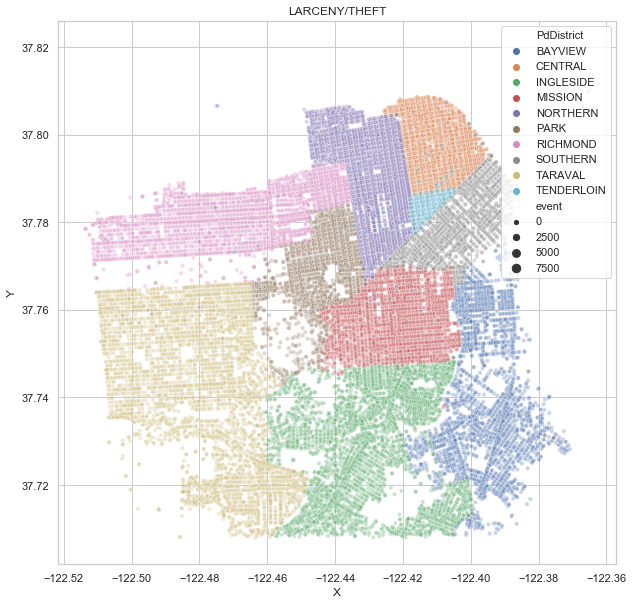

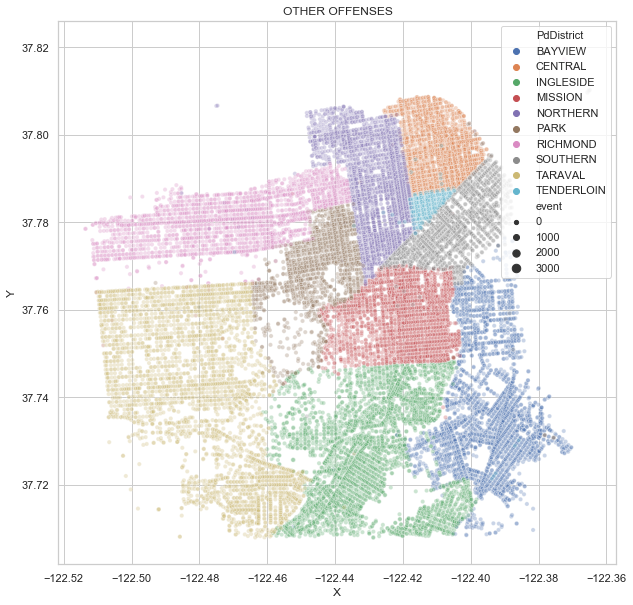

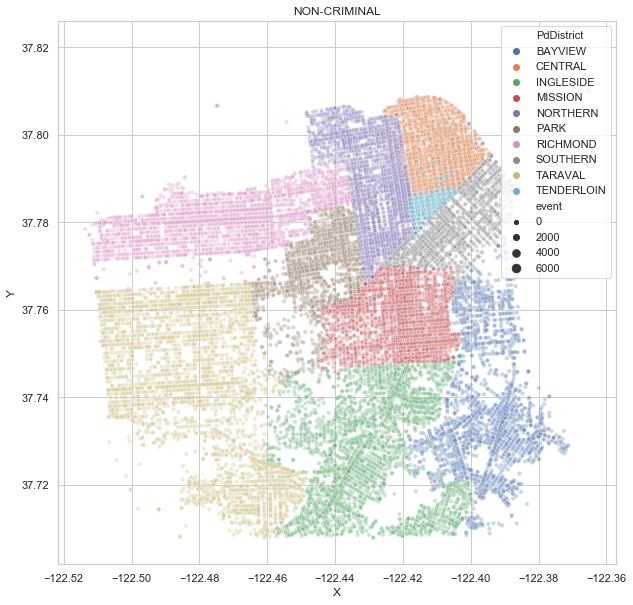

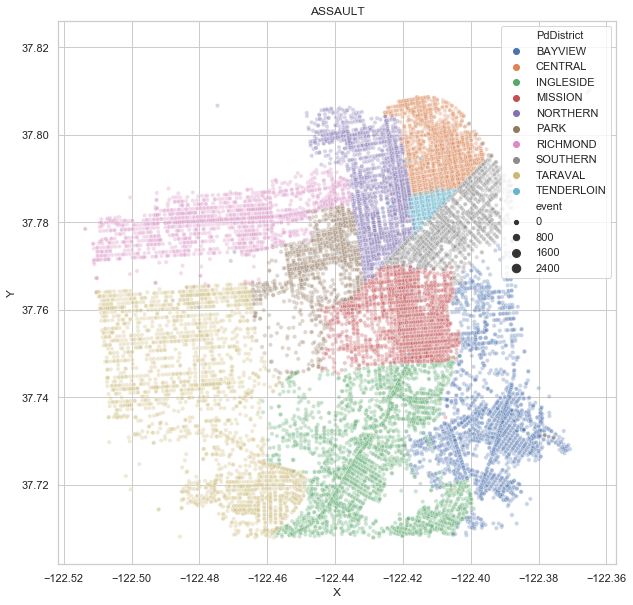

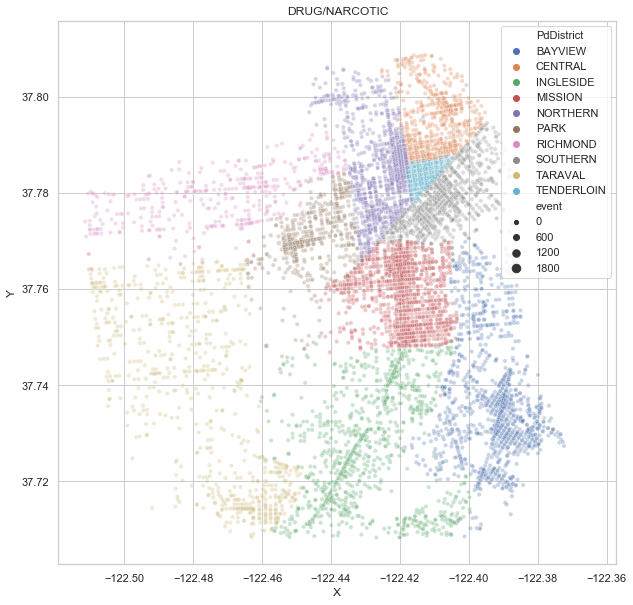

...

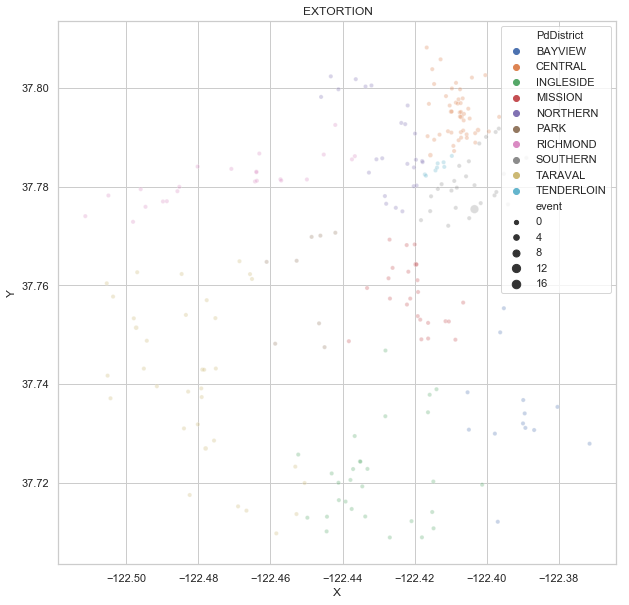

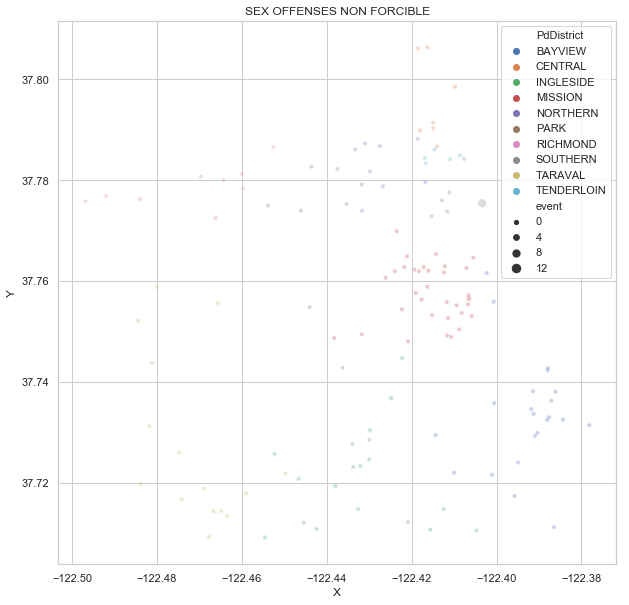

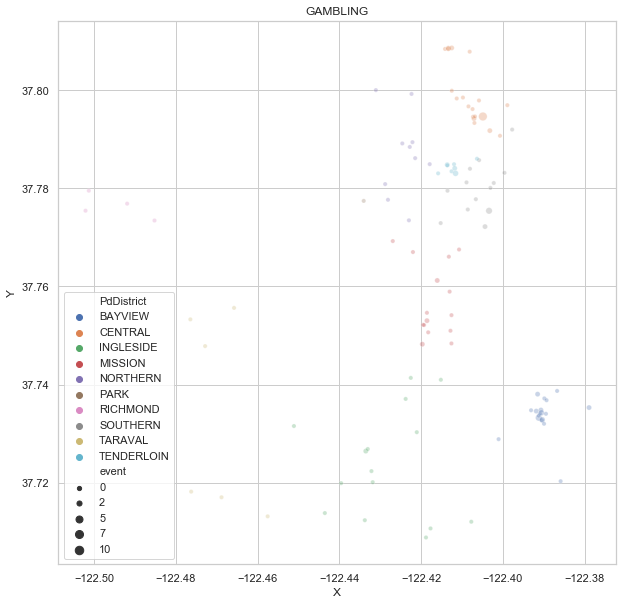

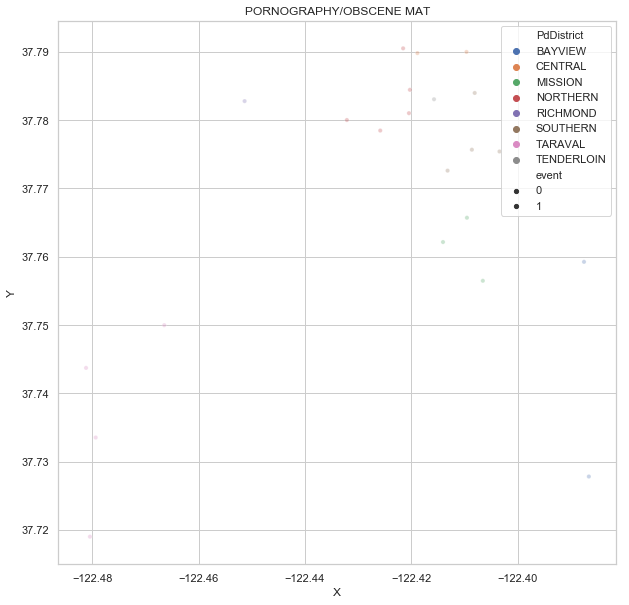

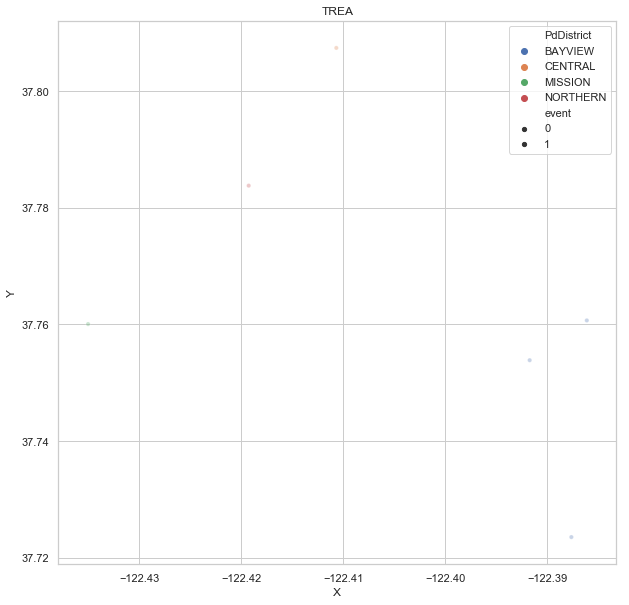

In [28]:
for i in most_crime.Category.unique():
    plt.figure(figsize=(10,10))
    plt.title(i)
    sns.scatterplot(x='X', y='Y', data=crime_pdDistrict[crime_pdDistrict['Category'] == i], hue='PdDistrict', size='event', alpha=0.3)
    plt.legend()

##### 각 범죄(Target별로 발생 지역 분포가 고르게 퍼져있었고, 특정 범죄별로 각 PdDistrict별로 많이 발생하는 위치가 있다는 것을 알 수 있음.
##### 특정 위치에서 특정 범죄가 많이 발생한다고 가정

In [88]:
idx = df[df.Category == 'TREA'].index
idx2 = df[df.Category == 'PORNOGRAPHY/OBSCENE MAT'].index
# idx3 = df[df.Category == 'GAMBLING'].index
# idx4 = df[df.Category == 'SEX OFFENSES NON FORCIBLE'].index
# idx5 = df[df.Category == 'EXTORTION'].index
# idx6 = df[df.Category == 'BRIBERY'].index
# idx7 = df[df.Category == 'BAD CHECKS'].index
# idx8 = df[df.Category == 'FAMILY OFFENSES'].index
# idx9 = df[df.Category == 'SUICIDE'].index
# idx10 = df[df.Category == 'EMBEZZLEMENT'].index
# idx11 = df[df.Category == 'LOITERING'].index

df.drop(index=idx, inplace=True)
df.drop(index=idx2, inplace=True)
# df.drop(index=idx3, inplace=True)
# df.drop(index=idx4, inplace=True)
# df.drop(index=idx5, inplace=True)
# df.drop(index=idx6, inplace=True)
# df.drop(index=idx7, inplace=True)
# df.drop(index=idx8, inplace=True)
# df.drop(index=idx9, inplace=True)
# df.drop(index=idx10, inplace=True)
# df.drop(index=idx11, inplace=True)

df[df.Category == 'PORNOGRAPHY/OBSCENE MAT']

,Category,DayOfWeek,PdDistrict,Address,X,Y,year,month,hour,addr,isStreet,IsInterection,event,addr2


In [89]:
x1 = pd.get_dummies(df[['DayOfWeek','PdDistrict','year','month','hour']], columns=['DayOfWeek','PdDistrict','year','month','hour'], sparse=False)
x2 = df[['isStreet','IsInterection','X','Y']]
x = pd.concat([x1,x2], axis=1)
x.tail()

,DayOfWeek_Friday,DayOfWeek_Monday,DayOfWeek_Saturday,DayOfWeek_Sunday,DayOfWeek_Thursday,DayOfWeek_Tuesday,DayOfWeek_Wednesday,PdDistrict_BAYVIEW,PdDistrict_CENTRAL,PdDistrict_INGLESIDE,...,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23,isStreet,IsInterection,X,Y
877977,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,1,-122.459033,37.714056
877978,0,1,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,1,0,-122.447364,37.731948
877979,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,1,-122.403390,37.780266
877980,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,1,-122.390531,37.780607
877981,0,1,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,-122.394926,37.738212


In [38]:
# x1 = pd.get_dummies(df[['DayOfWeek','PdDistrict','year','month','hour']], columns=['DayOfWeek','PdDistrict','year','month','hour'], sparse=False)
x = df[['isStreet','IsInterection','X','Y']]
# x = pd.concat([x1,x2], axis=1)
x.tail()

,isStreet,IsInterection,X,Y
877977,1,1,-122.459033,37.714056
877978,1,0,-122.447364,37.731948
877979,1,1,-122.403390,37.780266
877980,1,1,-122.390531,37.780607
877981,0,0,-122.394926,37.738212


In [100]:
# feature importance가 가장 작은 'PdDistrict_TARAVAL' drop해보자

In [102]:
# drop 한 후 다시 젤 낮은 'PdDistrict_BAYVIEW' drop

In [103]:
# x.drop(columns=['PdDistrict_TARAVAL', 'PdDistrict_BAYVIEW'], inplace=True)

### 4. Modeling
- Done
    - Logistic Regression
    - Bernoulli NB
    - RandomForest, ExtraTree
    - Gradient Boosting(LightGBM)
- Can't
    - Over-Sampling : MemoryError occured
##### 1. 모델의 fitting 속도가 약 20분정도 소요되어 cross-validation, Grid search 진행하지 않고, 직접 parameter를 바꿔가며 진행
##### 2. 평가기준이 Log-Loss이기 때문에 Accuracy, Recall-Rate 등의 수치개선에 목표를 두지 않음
##### 3. Log-loss를 낮추기 위해 Sample수가 현저하게 적은 하위  class를 순차적으로 제거하고 modeling도 진행(LightGBM)
##### 4. 하위 class 3개이상 제거하고 modeling시 train성능은 올라가지만, submission시 성능 저하, 하위 class 2개까지만 제거하여 최종 모델 생성

In [39]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import log_loss
import lightgbm as lgb
from sklearn.model_selection import validation_curve
from sklearn.preprocessing import LabelEncoder
from sklearn.multiclass import OneVsRestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import BernoulliNB

In [40]:
y0 = df['Category']

le = LabelEncoder().fit(y0)
y = le.transform(y0)

In [41]:
len(set(y))

39

In [42]:
x_train2, x_test2, y_train2, y_test2 = train_test_split(x, y, test_size=0.33, shuffle=True, random_state=11)

##### model : Logistic Regression

In [56]:
model_logi = LogisticRegression(random_state=1).fit(x_train2, y_train2)

In [57]:
log_loss(y_test2, model_logi.predict_proba(x_test2))

2.5157880833363517

In [ ]:
# After RandomOverSampling
# model_logi2 = LogisticRegression(n_jobs=4).fit(x_train, y_train)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:1228: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(self.n_jobs))


이건 너무 시간이 오래 걸리고, 팅김.

##### model : Bernoulli NB

In [45]:
np.random.seed(1)
model_bernNB = OneVsRestClassifier(BernoulliNB(),n_jobs=2).fit(x_train2, y_train2)

In [46]:
log_loss(y_test2, model_bernNB.predict_proba(x_test2))

2.525902395401517

##### model : extraTree, RandomForest

In [60]:
model_extraTree = ExtraTreesClassifier(n_estimators=200, max_depth=5, bootstrap=True, random_state=3, n_jobs=4, criterion='entropy').fit(x_train2, y_train2)

In [61]:
log_loss(y_test2, model_extraTree.predict_proba(x_test2))

2.5820069146517124

In [58]:
model_randomForest = RandomForestClassifier(n_estimators=300, max_depth=10, random_state=1, n_jobs=3, criterion='entropy').fit(x_train2, y_train2)

In [60]:
log_loss(y_test2, model_randomForest.predict_proba(x_test2))

2.497377793235836

In [65]:
model_randomForest2 = RandomForestClassifier(n_estimators=400, max_depth=10, random_state=1, n_jobs=3, criterion='entropy').fit(x_train2, y_train2)

In [66]:
log_loss(y_test2, model_randomForest2.predict_proba(x_test2))

2.497037157294504

In [75]:
model_randomForest3 = RandomForestClassifier(n_estimators=400, max_depth=15, random_state=1, max_leaf_nodes=80 ,n_jobs=3).fit(x_train2, y_train2)

In [76]:
log_loss(y_test2, model_randomForest3.predict_proba(x_test2))

2.5108387557470078

##### model : LightGBM

In [30]:
model_lgb = lgb.LGBMClassifier(learning_rate=0.05,boosting_type='gbdt',max_depth=7, num_leaves=70, n_estimators=200, objective='multiclass', num_class=39).fit(x_train2, y_train2)

In [31]:
log_loss(y_test2, model_lgb.predict_proba(x_test2))

2.478788551011272

In [12]:
model_lgb1 = lgb.LGBMClassifier(learning_rate=0.07, boosting_type='gbdt', max_depth=8, num_leaves=70, n_estimators=250, objective='multiclass', random_state=0, num_class=39).fit(x_train2, y_train2)

In [13]:
log_loss(y_test2, model_lgb1.predict_proba(x_test2))

2.470312676041389

In [54]:
model_lgb2 = lgb.LGBMClassifier(learning_rate=0.05, boosting_type='gbdt', max_depth=5, num_leaves=80, n_estimators=250, objective='multiclass', random_state=1, num_class=39).fit(x_train2, y_train2)

In [55]:
log_loss(y_test2, model_lgb2.predict_proba(x_test2))

2.5005977326612854

In [64]:
# 'TREA' 제거 후 LightGBM

In [80]:
model_lgbXY = lgb.LGBMClassifier(learning_rate=0.1, max_depth=6, num_leaves=70, n_estimators=200, objective='multiclass',
                                 random_state=1, num_class=38, n_jobs=3).fit(x_train2, y_train2)

In [81]:
log_loss(y_test2, model_lgbXY.predict_proba(x_test2))

2.3729208758454483

In [95]:
model_lgbXY2 = lgb.LGBMClassifier(learning_rate=0.1, max_depth=6, num_leaves=50, n_estimators=200, objective='multiclass',
                                 random_state=1, num_class=38, n_jobs=3).fit(x_train2, y_train2)

In [96]:
log_loss(y_test2, model_lgbXY2.predict_proba(x_test2))

2.371369920886394

In [103]:
model_lgbXY3 = lgb.LGBMClassifier(learning_rate=0.1, max_depth=8, num_leaves=50, n_estimators=200, objective='multiclass',
                                 random_state=1, num_class=38, n_jobs=3).fit(x_train2, y_train2)

In [104]:
log_loss(y_test2, model_lgbXY3.predict_proba(x_test2))

2.3672620525134587

In [109]:
model_lgbXY4 = lgb.LGBMClassifier(learning_rate=0.1, max_depth=8, num_leaves=50, n_estimators=200, objective='multiclass',
                                 random_state=1, num_class=38, n_jobs=3).fit(x_train2, y_train2)

In [110]:
log_loss(y_test2, model_lgbXY4.predict_proba(x_test2))

2.3706622209094275

In [61]:
# 'TREA','PORNOGRAPHY/OBSCENE MAT' 제거 후 LightGBM

In [71]:
model_lgbXY_rm2class = lgb.LGBMClassifier(learning_rate=0.05, max_depth=10, num_leaves=70, n_estimators=200, objective='multiclass',
                                 random_state=1, num_class=37, n_jobs=3).fit(x_train2, y_train2) 

In [72]:
log_loss(y_test2, model_lgbXY_rm2class.predict_proba(x_test2))

2.361576608017204

In [73]:
model_lgbXY_rm2class2 = lgb.LGBMClassifier(learning_rate=0.1, max_depth=10, num_leaves=70, n_estimators=200, objective='multiclass',
                                 random_state=1, num_class=37, n_jobs=3).fit(x_train2, y_train2) 

In [74]:
log_loss(y_test2, model_lgbXY_rm2class2.predict_proba(x_test2))

2.386601860677134

##### 하위 4개 제거 후 LightGBM

In [44]:
model_lgbXY_rm4class = lgb.LGBMClassifier(learning_rate=0.1, max_depth=5, num_leaves=40, n_estimators=200, objective='multiclass',
                                 random_state=2, num_class=35, n_jobs=3).fit(x_train2, y_train2) 

In [45]:
log_loss(y_test2, model_lgbXY_rm4class.predict_proba(x_test2))

2.3889315037932066

In [93]:
model_lgbXY_rm4class2 = lgb.LGBMClassifier(learning_rate=0.1, max_depth=6, num_leaves=40, n_estimators=200, objective='multiclass',
                                 random_state=10, num_class=35, n_jobs=3).fit(x_train2, y_train2) 

In [94]:
log_loss(y_test2, model_lgbXY_rm4class2.predict_proba(x_test2))

2.3747020004738184

In [95]:
model_lgbXY_rm4class3 = lgb.LGBMClassifier(learning_rate=0.15, max_depth=6, num_leaves=50, n_estimators=200, objective='multiclass',
                                 random_state=10, num_class=35, n_jobs=3).fit(x_train2, y_train2) 

In [96]:
log_loss(y_test2, model_lgbXY_rm4class3.predict_proba(x_test2))

2.364209697639233

##### 하위 6개 제거 후 LightGBM 

In [48]:
model_lgbXY_rm6class = lgb.LGBMClassifier(learning_rate=0.05, max_depth=8, num_leaves=70, n_estimators=200, objective='multiclass',
                                 random_state=3, num_class=33, n_jobs=3).fit(x_train2, y_train2) 

In [49]:
log_loss(y_test2, model_lgbXY_rm6class.predict_proba(x_test2))

2.3605454482707637

In [50]:
model_lgbXY_rm6class2 = lgb.LGBMClassifier(learning_rate=0.1, max_depth=8, num_leaves=70, n_estimators=200, objective='multiclass',
                                 random_state=3, num_class=33, n_jobs=3).fit(x_train2, y_train2) 

In [51]:
log_loss(y_test2, model_lgbXY_rm6class2.predict_proba(x_test2))

2.3439326207547238

In [54]:
model_lgbXY_rm6class3 = lgb.LGBMClassifier(learning_rate=0.11, max_depth=8, num_leaves=70, n_estimators=200, objective='multiclass',
                                 random_state=3, num_class=33, n_jobs=3).fit(x_train2, y_train2) 

In [55]:
log_loss(y_test2, model_lgbXY_rm6class3.predict_proba(x_test2))

2.3432079245533606

In [56]:
model_lgbXY_rm6class4 = lgb.LGBMClassifier(learning_rate=0.11, max_depth=10, num_leaves=100, n_estimators=200, objective='multiclass',
                                 random_state=3, num_class=33, n_jobs=3).fit(x_train2, y_train2) 

In [57]:
log_loss(y_test2, model_lgbXY_rm6class4.predict_proba(x_test2))

2.3342749185427185

In [65]:
model_lgbXY_rm6class5 = lgb.LGBMClassifier(learning_rate=0.11, max_depth=10, num_leaves=100, n_estimators=250, objective='multiclass',
                                 random_state=3, num_class=33, n_jobs=3).fit(x_train2, y_train2) 

In [66]:
log_loss(y_test2, model_lgbXY_rm6class5.predict_proba(x_test2))

2.333544334959555

In [63]:
model_lgbXY_rm6class6 = lgb.LGBMClassifier(learning_rate=0.1, max_depth=5, num_leaves=30, n_estimators=250, objective='multiclass',
                                 random_state=3, num_class=33, n_jobs=3).fit(x_train2, y_train2) 

In [64]:
log_loss(y_test2, model_lgbXY_rm6class6.predict_proba(x_test2))

2.371008384636285

##### 하위 7개 제거 후 LightGBM 

In [56]:
model_lgbXY_rm7class = lgb.LGBMClassifier(learning_rate=0.1, max_depth=5, num_leaves=25, n_estimators=250, objective='multiclass',
                                 random_state=4, num_class=32, n_jobs=3).fit(x_train2, y_train2) 

In [57]:
log_loss(y_test2, model_lgbXY_rm7class.predict_proba(x_test2))

2.3712254442049177

In [73]:
model_lgbXY_rm7class.feature_importances_

array([ 1864,  1602,  2059,  2167,  1450,  1639,  1552,  1037,   765,
         931,  1775,  1338,  1138,   834,  1600,   411,  1810,  2215,
        2122,  2101,  1655,  1889,  1804,  1685,  1806,  1719,  1736,
        2086,  2114,  1556,  1659,  1634,  1578,  1329,  1463,  1317,
        1291,  1395,  1243,  1410,  1392,  1641,  1929,  1774,  1801,
        1560,  1250,  1260,  1173,  1535,  1427,  1345,  1228,  1117,
        1375,  1209,  1149,  1264,  1021,  1074,  1042,  1071,  1129,
        1270,  1279,  1538,  2505,  5430, 42293, 44103])

In [77]:
dic = {}
for i in range(len(x_train2.columns)):
    dic[x_train2.columns[i]] = model_lgbXY_rm7class.feature_importances_[i]
dic

{'DayOfWeek_Friday': 1864,
 'DayOfWeek_Monday': 1602,
 'DayOfWeek_Saturday': 2059,
 'DayOfWeek_Sunday': 2167,
 'DayOfWeek_Thursday': 1450,
 'DayOfWeek_Tuesday': 1639,
 'DayOfWeek_Wednesday': 1552,
 'PdDistrict_BAYVIEW': 1037,
 'PdDistrict_CENTRAL': 765,
 'PdDistrict_INGLESIDE': 931,
 'PdDistrict_MISSION': 1775,
 'PdDistrict_NORTHERN': 1338,
 'PdDistrict_PARK': 1138,
 'PdDistrict_RICHMOND': 834,
 'PdDistrict_SOUTHERN': 1600,
 'PdDistrict_TARAVAL': 411,
 'PdDistrict_TENDERLOIN': 1810,
 'year_2003': 2215,
 'year_2004': 2122,
 'year_2005': 2101,
 'year_2006': 1655,
 'year_2007': 1889,
 'year_2008': 1804,
 'year_2009': 1685,
 'year_2010': 1806,
 'year_2011': 1719,
 'year_2012': 1736,
 'year_2013': 2086,
 'year_2014': 2114,
 'year_2015': 1556,
 'month_1': 1659,
 'month_2': 1634,
 'month_3': 1578,
 'month_4': 1329,
 'month_5': 1463,
 'month_6': 1317,
 'month_7': 1291,
 'month_8': 1395,
 'month_9': 1243,
 'month_10': 1410,
 'month_11': 1392,
 'month_12': 1641,
 'hour_0': 1929,
 'hour_1': 1774,

In [117]:
model_lgbXY_rm7class = lgb.LGBMClassifier(learning_rate=0.1, max_depth=8, num_leaves=70, n_estimators=200, objective='multiclass',
                                 random_state=6, num_class=32, n_jobs=3).fit(x_train2, y_train2)

In [118]:
log_loss(y_test2, model_lgbXY_rm7class.predict_proba(x_test2))

2.348808828637822

##### 하위 8개 제거 후 LightGBM 

In [43]:
model_lgbXY_rm8class = lgb.LGBMClassifier(learning_rate=0.1, max_depth=6, num_leaves=40, n_estimators=200, objective='multiclass',
                                 random_state=7, num_class=31, n_jobs=3).fit(x_train2, y_train2)

In [44]:
log_loss(y_test2, model_lgbXY_rm8class.predict_proba(x_test2))

2.360365190062419

In [45]:
model_lgbXY_rm8class2 = lgb.LGBMClassifier(learning_rate=0.1, max_depth=6, num_leaves=50, n_estimators=200, objective='multiclass',
                                 random_state=7, num_class=31, n_jobs=3).fit(x_train2, y_train2)

In [46]:
log_loss(y_test2, model_lgbXY_rm8class2.predict_proba(x_test2))

2.357222203129988

In [47]:
model_lgbXY_rm8class3 = lgb.LGBMClassifier(learning_rate=0.12, max_depth=6, num_leaves=50, n_estimators=200, objective='multiclass',
                                 random_state=7, num_class=31, n_jobs=3).fit(x_train2, y_train2)

In [48]:
log_loss(y_test2, model_lgbXY_rm8class3.predict_proba(x_test2))

2.3525376737869976

##### 하위 9개 제거 후 LightGBM 

In [58]:
model_lgbXY_rm9class = lgb.LGBMClassifier(learning_rate=0.12, max_depth=6, num_leaves=50, n_estimators=200, objective='multiclass',
                                 random_state=8, num_class=30, n_jobs=3).fit(x_train2, y_train2)

In [59]:
log_loss(y_test2, model_lgbXY_rm9class.predict_proba(x_test2))

2.3530176358314447

In [60]:
model_lgbXY_rm9class2 = lgb.LGBMClassifier(learning_rate=0.125, max_depth=6, num_leaves=50, n_estimators=200, objective='multiclass',
                                 random_state=8, num_class=30, n_jobs=3).fit(x_train2, y_train2)

In [61]:
log_loss(y_test2, model_lgbXY_rm9class2.predict_proba(x_test2))

2.3501115189767554

In [62]:
model_lgbXY_rm9class3 = lgb.LGBMClassifier(learning_rate=0.13, max_depth=6, num_leaves=50, n_estimators=200, objective='multiclass',
                                 random_state=8, num_class=30, n_jobs=3).fit(x_train2, y_train2)

In [63]:
log_loss(y_test2, model_lgbXY_rm9class3.predict_proba(x_test2))

2.3487833967859153

In [64]:
model_lgbXY_rm9class4 = lgb.LGBMClassifier(learning_rate=0.135, max_depth=6, num_leaves=50, n_estimators=200, objective='multiclass',
                                 random_state=8, num_class=30, n_jobs=3).fit(x_train2, y_train2)

In [65]:
log_loss(y_test2, model_lgbXY_rm9class4.predict_proba(x_test2))

2.3481597929080964

In [66]:
model_lgbXY_rm9class5 = lgb.LGBMClassifier(learning_rate=0.14, max_depth=6, num_leaves=50, n_estimators=200, objective='multiclass',
                                 random_state=8, num_class=30, n_jobs=3).fit(x_train2, y_train2)

In [67]:
log_loss(y_test2, model_lgbXY_rm9class5.predict_proba(x_test2))

2.3473595168910917

In [68]:
model_lgbXY_rm9class6 = lgb.LGBMClassifier(learning_rate=0.145, max_depth=6, num_leaves=50, n_estimators=200, objective='multiclass',
                                 random_state=8, num_class=30, n_jobs=3).fit(x_train2, y_train2)

In [69]:
log_loss(y_test2, model_lgbXY_rm9class6.predict_proba(x_test2))

2.346045474268874

In [70]:
model_lgbXY_rm9class7 = lgb.LGBMClassifier(learning_rate=0.15, max_depth=6, num_leaves=50, n_estimators=200, objective='multiclass',
                                 random_state=8, num_class=30, n_jobs=3).fit(x_train2, y_train2)

In [71]:
log_loss(y_test2, model_lgbXY_rm9class7.predict_proba(x_test2))

2.3458863658623037

In [72]:
model_lgbXY_rm9class8 = lgb.LGBMClassifier(learning_rate=0.16, max_depth=6, num_leaves=50, n_estimators=200, objective='multiclass',
                                 random_state=8, num_class=30, n_jobs=3).fit(x_train2, y_train2)

In [73]:
log_loss(y_test2, model_lgbXY_rm9class8.predict_proba(x_test2))

2.3447822768602946

In [74]:
model_lgbXY_rm9class9 = lgb.LGBMClassifier(learning_rate=0.17, max_depth=6, num_leaves=50, n_estimators=200, objective='multiclass',
                                 random_state=8, num_class=30, n_jobs=3).fit(x_train2, y_train2)

In [75]:
log_loss(y_test2, model_lgbXY_rm9class9.predict_proba(x_test2))

2.344066666121196

In [76]:
model_lgbXY_rm9class10 = lgb.LGBMClassifier(learning_rate=0.18, max_depth=6, num_leaves=50, n_estimators=200, objective='multiclass',
                                 random_state=8, num_class=30, n_jobs=3).fit(x_train2, y_train2)

In [77]:
log_loss(y_test2, model_lgbXY_rm9class10.predict_proba(x_test2))

2.349246552165014

##### 하위 10개 제거 후 LightGBM 

In [88]:
model_lgbXY_rm10class = lgb.LGBMClassifier(learning_rate=0.1, max_depth=6, num_leaves=50, n_estimators=200, objective='multiclass',
                                 random_state=9, num_class=29, n_jobs=3).fit(x_train2, y_train2)

In [89]:
log_loss(y_test2, model_lgbXY_rm10class.predict_proba(x_test2))

2.3495847300244836

In [90]:
model_lgbXY_rm10class2 = lgb.LGBMClassifier(learning_rate=0.15, max_depth=6, num_leaves=50, n_estimators=200, objective='multiclass',
                                 random_state=9, num_class=29, n_jobs=3).fit(x_train2, y_train2)

In [91]:
log_loss(y_test2, model_lgbXY_rm10class2.predict_proba(x_test2))

2.3380644228390763

In [92]:
model_lgbXY_rm10class3 = lgb.LGBMClassifier(learning_rate=0.17, max_depth=6, num_leaves=50, n_estimators=200, objective='multiclass',
                                 random_state=9, num_class=29, n_jobs=3).fit(x_train2, y_train2)

In [93]:
log_loss(y_test2, model_lgbXY_rm10class3.predict_proba(x_test2))

2.3362690988412655

##### 하위 11개 제거 후 LightGBM 

In [95]:
del model_lgbXY_rm10class, model_lgbXY_rm10class2, model_lgbXY_rm10class3

In [96]:
gc.collect()

115

In [104]:
model_lgbXY_rm11class = lgb.LGBMClassifier(learning_rate=0.1, max_depth=6, num_leaves=50, n_estimators=200, objective='multiclass',
                                 random_state=10, num_class=28, n_jobs=3).fit(x_train2, y_train2)

In [105]:
log_loss(y_test2, model_lgbXY_rm11class.predict_proba(x_test2))

2.345268296669364

In [43]:
model_lgbXY_rm11class2 = lgb.LGBMClassifier(learning_rate=0.15, max_depth=6, num_leaves=50, n_estimators=200, objective='multiclass',
                                 random_state=10, num_class=28, n_jobs=3).fit(x_train2, y_train2)

In [44]:
log_loss(y_test2, model_lgbXY_rm11class2.predict_proba(x_test2))

2.333719375911074

In [41]:
model_lgbXY_rm11class3 = lgb.LGBMClassifier(learning_rate=0.17, max_depth=6, num_leaves=50, n_estimators=200, objective='multiclass',
                                 random_state=10, num_class=28, n_jobs=3).fit(x_train2, y_train2)

In [42]:
log_loss(y_test2, model_lgbXY_rm11class3.predict_proba(x_test2))

2.3342040499706993

In [49]:
# feature importance가 가장 작은 'PdDistrict_TARAVAL' drop후 modeling
model_lgbXY_rm7class_dropPdDistrict_TARAVAL = lgb.LGBMClassifier(learning_rate=0.1, max_depth=5, num_leaves=25, n_estimators=250, objective='multiclass',
                                 random_state=5, num_class=32, n_jobs=3).fit(x_train2, y_train2) 

In [50]:
log_loss(y_test2, model_lgbXY_rm7class_dropPdDistrict_TARAVAL.predict_proba(x_test2))

2.35635844918868

In [84]:
model_lgbXY_rm7class_dropPdDistrict_TARAVAL.feature_importances_

array([ 1736,  1676,  1944,  2183,  1458,  1740,  1817,   941,   767,
         962,  1721,  1380,  1212,   870,  1522,  1827,  2238,  2213,
        2044,  1572,  1887,  1825,  1723,  1728,  1635,  1684,  2002,
        2176,  1439,  1774,  1422,  1494,  1492,  1434,  1379,  1207,
        1209,  1273,  1281,  1296,  1647,  1988,  1770,  1933,  1587,
        1348,  1292,  1230,  1562,  1538,  1340,  1366,  1125,  1351,
        1017,  1130,  1288,  1054,  1117,  1133,  1201,  1154,  1259,
        1228,  1335,  2388,  5243, 42654, 44468])

In [98]:
dic = {}
for i in range(len(x_train2.columns)):
    dic[x_train2.columns[i]] = model_lgbXY_rm7class_dropPdDistrict_TARAVAL.feature_importances_[i]
dic

{'DayOfWeek_Friday': 1736,
 'DayOfWeek_Monday': 1676,
 'DayOfWeek_Saturday': 1944,
 'DayOfWeek_Sunday': 2183,
 'DayOfWeek_Thursday': 1458,
 'DayOfWeek_Tuesday': 1740,
 'DayOfWeek_Wednesday': 1817,
 'PdDistrict_BAYVIEW': 941,
 'PdDistrict_CENTRAL': 767,
 'PdDistrict_INGLESIDE': 962,
 'PdDistrict_MISSION': 1721,
 'PdDistrict_NORTHERN': 1380,
 'PdDistrict_PARK': 1212,
 'PdDistrict_RICHMOND': 870,
 'PdDistrict_SOUTHERN': 1522,
 'year_2003': 1827,
 'year_2004': 2238,
 'year_2005': 2213,
 'year_2006': 2044,
 'year_2007': 1572,
 'year_2008': 1887,
 'year_2009': 1825,
 'year_2010': 1723,
 'year_2011': 1728,
 'year_2012': 1635,
 'year_2013': 1684,
 'year_2014': 2002,
 'year_2015': 2176,
 'month_1': 1439,
 'month_2': 1774,
 'month_3': 1422,
 'month_4': 1494,
 'month_5': 1492,
 'month_6': 1434,
 'month_7': 1379,
 'month_8': 1207,
 'month_9': 1209,
 'month_10': 1273,
 'month_11': 1281,
 'month_12': 1296,
 'hour_0': 1647,
 'hour_1': 1988,
 'hour_2': 1770,
 'hour_3': 1933,
 'hour_4': 1587,
 'hour_5'

In [94]:
# 'PdDistrict_BAYVIEW'까지 추가 제거

In [105]:
model_lgbXY_rm7class_dropPdDistrict_BAYVIEW = lgb.LGBMClassifier(learning_rate=0.1, max_depth=5, num_leaves=25, n_estimators=250, objective='multiclass',
                                 random_state=6, num_class=32, n_jobs=3).fit(x_train2, y_train2) 

In [111]:
log_loss(y_test2, model_lgbXY_rm7class_dropPdDistrict_BAYVIEW.predict_proba(x_test2))

2.375287397922324

In [112]:
model_lgbXY_rm7class_dropPdDistrict_BAYVIEW.feature_importances_

array([ 1688,  1631,  2137,  2239,  1480,  1777,  1714,   814,   918,
        1842,  1315,  1168,   968,  1651,  1817,  2176,  2330,  1972,
        1601,  1830,  1747,  1668,  1716,  1734,  1727,  1935,  2167,
        1582,  1684,  1565,  1620,  1447,  1454,  1197,  1287,  1349,
        1304,  1459,  1422,  1503,  2122,  1715,  1821,  1550,  1331,
        1207,  1212,  1579,  1407,  1324,  1250,  1169,  1434,  1106,
        1090,  1221,  1013,  1117,  1149,  1143,  1229,  1288,  1307,
        1391,  2452,  5268, 42954, 44459])

### test.csv에 적용

In [100]:
df_test['year'] = df_test['Dates'].map(lambda x: x.year)
df_test['month'] = df_test['Dates'].map(lambda x: x.month)
df_test['hour'] = df_test['Dates'].map(lambda x: x.hour)

In [101]:
df_test.drop(columns='Dates', inplace=True)
df_test.tail()

,Id,DayOfWeek,PdDistrict,Address,X,Y,year,month,hour
884257,884257,Wednesday,MISSION,2600 Block of BRYANT ST,-122.408983,37.751987,2003,1,0
884258,884258,Wednesday,NORTHERN,1900 Block of WASHINGTON ST,-122.425342,37.792681,2003,1,0
884259,884259,Wednesday,INGLESIDE,5500 Block of MISSION ST,-122.445418,37.712075,2003,1,0
884260,884260,Wednesday,BAYVIEW,1500 Block of HUDSON AV,-122.387394,37.739479,2003,1,0
884261,884261,Wednesday,TARAVAL,1500 Block of SLOAT BL,-122.489714,37.733950,2003,1,0


In [102]:
def street_addr(x):
    street=x.split(' ')
    return (' '.join(street[-1:]))

In [103]:
df_test['addr'] = df_test['Address'].apply(lambda x:street_addr(x))
df_test['addr'].tail()

884257    ST
884258    ST
884259    ST
884260    AV
884261    BL
Name: addr, dtype: object

In [104]:
df_test['isStreet'] = np.array([1 if value == 'ST' else 0 for value in df_test.addr.values])

In [105]:
df_test["IsInterection"] = df_test["Address"].apply(lambda x: 1 if "/" in x else 0)

In [106]:
df_test.tail()

,Id,DayOfWeek,PdDistrict,Address,X,Y,year,month,hour,addr,isStreet,IsInterection
884257,884257,Wednesday,MISSION,2600 Block of BRYANT ST,-122.408983,37.751987,2003,1,0,ST,1,0
884258,884258,Wednesday,NORTHERN,1900 Block of WASHINGTON ST,-122.425342,37.792681,2003,1,0,ST,1,0
884259,884259,Wednesday,INGLESIDE,5500 Block of MISSION ST,-122.445418,37.712075,2003,1,0,ST,1,0
884260,884260,Wednesday,BAYVIEW,1500 Block of HUDSON AV,-122.387394,37.739479,2003,1,0,AV,0,0
884261,884261,Wednesday,TARAVAL,1500 Block of SLOAT BL,-122.489714,37.733950,2003,1,0,BL,0,0


In [107]:
x1 = pd.get_dummies(df_test[['DayOfWeek','PdDistrict','year','month','hour']], columns=['DayOfWeek','PdDistrict','year','month','hour'], sparse=False)
x2 = df_test[['isStreet','IsInterection','X','Y']]
x_test = pd.concat([x1,x2], axis=1)
x_test.tail()

,DayOfWeek_Friday,DayOfWeek_Monday,DayOfWeek_Saturday,DayOfWeek_Sunday,DayOfWeek_Thursday,DayOfWeek_Tuesday,DayOfWeek_Wednesday,PdDistrict_BAYVIEW,PdDistrict_CENTRAL,PdDistrict_INGLESIDE,...,hour_18,hour_19,hour_20,hour_21,hour_22,hour_23,isStreet,IsInterection,X,Y
884257,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,1,0,-122.408983,37.751987
884258,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,1,0,-122.425342,37.792681
884259,0,0,0,0,0,0,1,0,0,1,...,0,0,0,0,0,0,1,0,-122.445418,37.712075
884260,0,0,0,0,0,0,1,1,0,0,...,0,0,0,0,0,0,0,0,-122.387394,37.739479
884261,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,-122.489714,37.733950


In [108]:
pred = model_lgbXY_rm11class3.predict_proba(x_test)

In [109]:
trea = np.zeros(len(x_test))
PORNOGRAPHY_OBSCENE_MAT = np.zeros(len(x_test))
GAMBLING = np.zeros(len(x_test))
SEX_OFFENSES_NON_FORCIBLE = np.zeros(len(x_test))
# EXTORTION = np.zeros(len(x_test))
# BRIBERY = np.zeros(len(x_test))
# BAD_CHECKS = np.zeros(len(x_test))
# FAMILY_OFFENSES = np.zeros(len(x_test))
# SUICIDE = np.zeros(len(x_test))
# EMBEZZLEMENT = np.zeros(len(x_test)) 
# LOITERING = np.zeros(len(x_test)) 


trea_df = pd.DataFrame(trea, columns=['TREA'])
PORNOGRAPHY_OBSCENE_MAT_df = pd.DataFrame(PORNOGRAPHY_OBSCENE_MAT, columns=['PORNOGRAPHY/OBSCENE MAT'])
GAMBLING_df = pd.DataFrame(GAMBLING, columns=['GAMBLING'])
SEX_OFFENSES_NON_FORCIBLE_df = pd.DataFrame(SEX_OFFENSES_NON_FORCIBLE, columns=['SEX OFFENSES NON FORCIBLE'])
# EXTORTION_df = pd.DataFrame(EXTORTION, columns=['EXTORTION'])
# BRIBERY_df = pd.DataFrame(BRIBERY, columns=['BRIBERY'])
# BAD_CHECKS_df = pd.DataFrame(BAD_CHECKS, columns=['BAD CHECKS'])
# FAMILY_OFFENSES_df = pd.DataFrame(FAMILY_OFFENSES, columns=['FAMILY OFFENSES'])
# SUICIDE_df = pd.DataFrame(SUICIDE, columns=['SUICIDE'])
# EMBEZZLEMENT_df = pd.DataFrame(EMBEZZLEMENT, columns=['EMBEZZLEMENT'])
# LOITERING_df = pd.DataFrame(LOITERING, columns=['LOITERING'])
# , EXTORTION_df, BRIBERY_df, BAD_CHECKS_df, FAMILY_OFFENSES_df, SUICIDE_df, EMBEZZLEMENT_df, LOITERING_df

In [110]:
id = df_test[['Id']]
df_prediction = pd.DataFrame(pred, columns=le.classes_)
result = pd.concat([id,df_prediction,trea_df,PORNOGRAPHY_OBSCENE_MAT_df, GAMBLING_df, SEX_OFFENSES_NON_FORCIBLE_df], axis=1)

In [111]:
result.tail()

,Id,ARSON,ASSAULT,BAD CHECKS,BRIBERY,BURGLARY,DISORDERLY CONDUCT,DRIVING UNDER THE INFLUENCE,DRUG/NARCOTIC,DRUNKENNESS,...,SUSPICIOUS OCC,TRESPASS,VANDALISM,VEHICLE THEFT,WARRANTS,WEAPON LAWS,TREA,PORNOGRAPHY/OBSCENE MAT,GAMBLING,SEX OFFENSES NON FORCIBLE
884257,884257,0.002127,0.117231,0.002777,0.000111,0.032180,0.001476,0.002875,0.040941,0.005789,...,0.043212,0.007880,0.074013,0.093060,0.039840,0.007225,0.0,0.0,0.0,0.0
884258,884258,0.001226,0.060944,0.009305,0.000004,0.099863,0.009899,0.001157,0.017681,0.002884,...,0.047375,0.010384,0.062161,0.102220,0.012219,0.002437,0.0,0.0,0.0,0.0
884259,884259,0.001056,0.137314,0.000407,0.000002,0.018458,0.000974,0.000886,0.025370,0.001681,...,0.020956,0.002537,0.058337,0.176710,0.037894,0.005813,0.0,0.0,0.0,0.0
884260,884260,0.007968,0.117679,0.001279,0.000042,0.041490,0.000936,0.001243,0.029457,0.001423,...,0.051373,0.004296,0.056660,0.086928,0.047877,0.011269,0.0,0.0,0.0,0.0
884261,884261,0.001005,0.062123,0.005871,0.000014,0.045821,0.018242,0.000780,0.011053,0.001902,...,0.062715,0.005300,0.054843,0.073305,0.016591,0.006576,0.0,0.0,0.0,0.0


In [112]:
result.to_csv("LightGBM7.csv", index=False)